In [1]:
%matplotlib widget
# Add the directory containing the package to sys.path
import sys
import numpy as np
from numpy import pi, cos, sin
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
from tqdm import tqdm
np.set_printoptions(precision=2, suppress=True)
# Enable LaTeX rendering
plt.rc('text', usetex=True)
# Improve resolution
plt.rcParams['figure.dpi'] = 150
plt.rcParams['savefig.dpi'] = 300

In [2]:
#Vitesse du son au moment de la mesure, dependant de la temperature:
Tc = 21.5 
C = np.sqrt( 1.4 * 287 *(Tc + 273) )
Path = './'
NbMems = 256
NbViolTot = 6
NbViol = 6
NumViolon = [1, 4, 5, 9, 11, 13]  # Violons a analyser
DyndB = 90

NumViolon = np.load('./../results/NumViolon.npz')['NumViolon']
XYZViolins = np.load('./../results/XYZViolinsAligned.npy')

NbMics = 256
NbSrcs = XYZViolins.shape[0] - NbMics

XYZHammerImpact = XYZViolins[NbSrcs-1]
XYZ = XYZViolins-XYZHammerImpact
XYZs = XYZ[:NbSrcs-1]
XYZm = XYZ[NbSrcs:]
XYZHammerImpact = XYZ[NbSrcs-1]

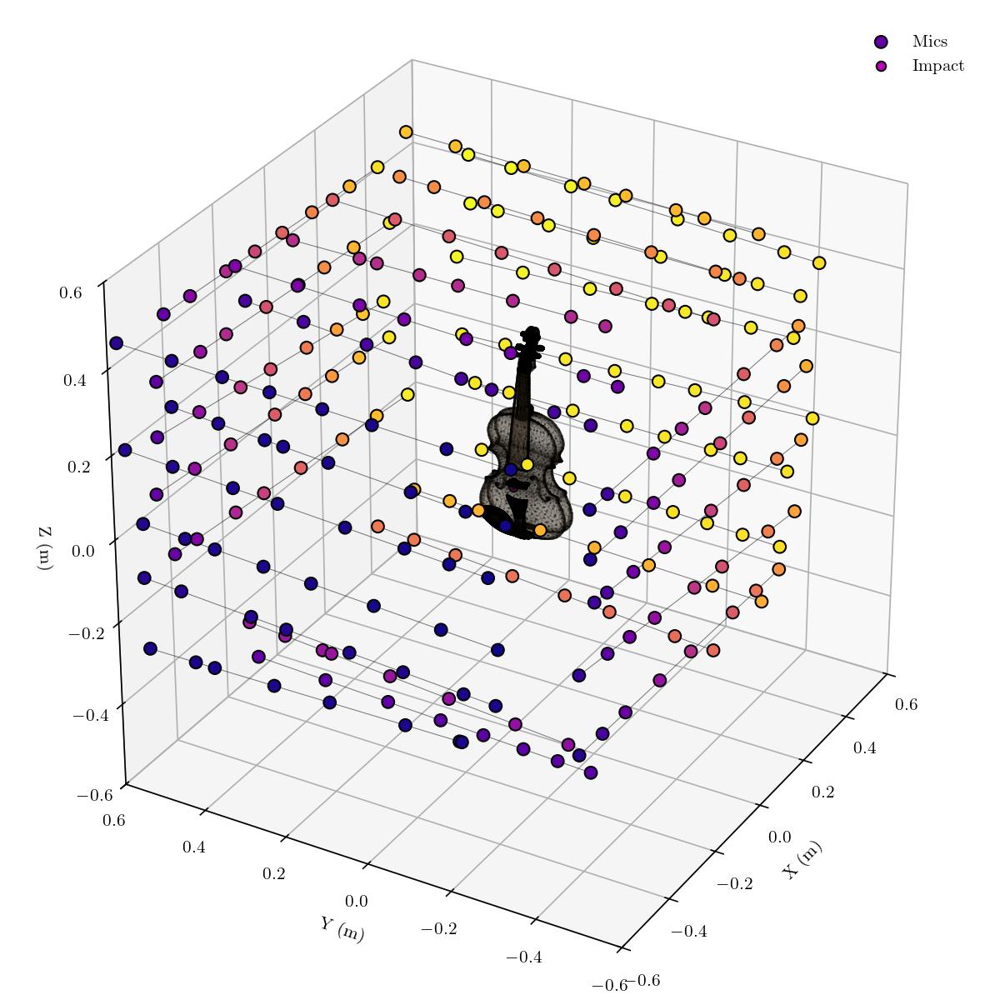

In [4]:
import sys
if '../scripts' not in sys.path:
    sys.path.insert(0, '../scripts')

import utils_DirViolins as udv
import importlib
importlib.reload(udv)
from matplotlib.colors import LinearSegmentedColormap

vertices, faces = udv.load_violin_mesh('../src/Meshes/violin.ply')

# Plot array using threejs interactively
_= udv.plot_array_matplotlib(XYZm, None, XYZHammerImpact, vertices, faces, NbMics,
                           mic_s=50, mic_c=XYZm[:, 0], mic_cmap='plasma')
#_ = udv.plot_array_threejs(XYZm, None, XYZHammerImpact, vertices, faces, NbMics)

In [12]:
import os

# In this repo layout, swd2 processing modules live under swd2/src
swd2_root_dir = os.path.abspath("C:/Users/froll/Documents/Labo/Projets/Outils/swd/swd2")
if swd2_root_dir not in sys.path:
    sys.path.insert(0, swd2_root_dir)

import src.spherical_processing as swd
import src.geotools as geom

Max_Order = 15
CmnFileName = f'./../results/CmnO{Max_Order}_Optimization_Results_0.npz'
Cmn = np.load(CmnFileName)['Cmn_all']
frq = np.load(CmnFileName)['freqs']
kvect = 2*np.pi*frq/C
NbFreqs = len(kvect)
frqMax = frq[-1]
N_SH = int(np.sqrt(Cmn.shape[1]) - 1)
f_FFD_max = kvect[N_SH] * C / (2 * np.pi)

In [13]:
# Compute 3D FFD (Far-Field Directivity Dinf) from SH coefficients

Dirs, weights = geom.create_equal_angle_grid(N = 15)
NbDirs = Dirs.shape[0]
print(f"Starting far-field directivity (Dinf) computation...")

FFD = np.zeros((NbViol, NbDirs, NbFreqs), dtype=np.complex128)
print(f"FFD shape: {FFD.shape}, dtype: {FFD.dtype}")
for i in tqdm(range(NbViol), desc="Violins"):    
    FFD[i] = swd.compute_Dinf_from_SH_coefs_at_origin(Cmn[i], Dirs, kvect)

print("FFD computation complete!")
print(f"FFD magnitude range: [{np.abs(FFD).min():.3e}, {np.abs(FFD).max():.3e}]")
print(f"FFD real part range: [{FFD.real.min():.3e}, {FFD.real.max():.3e}]")
print(f"FFD imag part range: [{FFD.imag.min():.3e}, {FFD.imag.max():.3e}]")

Starting far-field directivity (Dinf) computation...
FFD shape: (6, 1024, 2480), dtype: complex128


Violins: 100%|██████████| 6/6 [00:04<00:00,  1.36it/s]

FFD computation complete!
FFD magnitude range: [1.509e-04, 2.713e+02]
FFD real part range: [-2.694e+02, 2.705e+02]
FFD imag part range: [-2.508e+02, 2.287e+02]


## Physical interpretation of the common residual delay $\Delta r$

The excess phase is computed by removing the free-field propagation delay $2\pi f R / C$ from the unwrapped phase. After further subtracting the direction-averaged linear trend (fit vs. frequency), a nearly constant additional delay $\Delta r / C$ remains, common to all violins.

**Most probable causes:**

1. **Effective acoustic center offset**: The violin radiates from its entire body, not from the origin (bridge/impact point). The linear phase slope corresponds to the centroid of radiation being displaced from the reference point by $\Delta r$ on average. This is the "acoustic center" of the instrument — a geometric/radiation property shared by all instruments of similar shape.

2. **Minimum-phase decomposition**: The total transfer function = minimum-phase part × all-pass part. The linear phase trend is the all-pass (pure delay) component. It encodes the *non-minimum-phase* nature of the radiation: even after removing free-field propagation to $R$, the instrument introduces a residual group delay $\tau = \Delta r / C$ common to all directions and all violins.

3. **Structural propagation delay**: Vibration injected at the bridge travels through the plate before being radiated. The finite plate wave speed adds a small but systematic delay before acoustic radiation begins, roughly instrument-size-dependent — hence similar across violins of standard dimensions.

4. **Measurement alignment**: If the coordinate origin used in the SH reconstruction does not exactly coincide with the true acoustic center of the instrument, the residual delay absorbs that offset.

**In summary**: $\Delta r$ most likely reflects the **displacement between the mechanical excitation reference (bridge) and the effective acoustic radiation center** of the violin body — a structural property common to all instruments of standard size, not a time-of-flight artifact.

Global max of |FFD| (99.9%): 1.2496e+02
Starting Sagittal slice directivity (Dinf) computation...
SagFFD shape: (6, 361, 2480), dtype: complex128


Violins: 100%|██████████| 6/6 [00:02<00:00,  2.09it/s]


Sagittal slice FFD computation complete!
SagFFD magnitude range: [5.748e-04, 2.702e+02]
SagFFD real part range: [-2.694e+02, 2.307e+02]
SagFFD imag part range: [-1.749e+02, 2.286e+02]


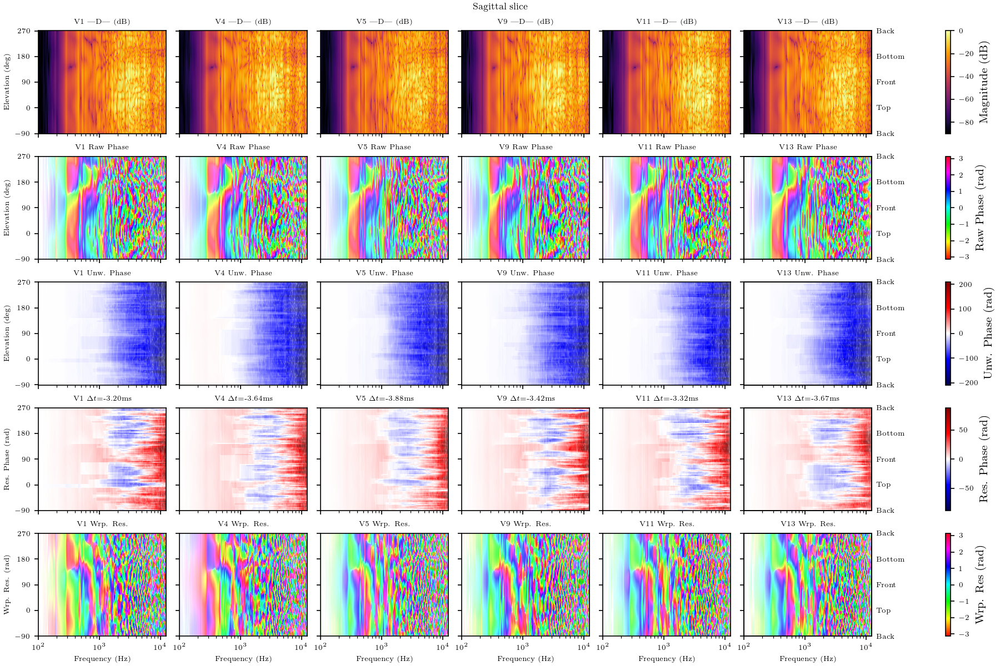

In [14]:

# Sagittal slice: Back(-90) -> Top(0) -> Front(90) -> Bottom(180) -> Back(270)

GlobMax = np.percentile(np.abs(FFD), 99.9)
print(f"Global max of |FFD| (99.9%): {GlobMax:.4e}")

Th_plot = np.linspace(-np.pi/2, 3*np.pi/2, 361) # 1-degree resolution continuous axis
Th_eval = np.zeros_like(Th_plot)
Phi_eval = np.zeros_like(Th_plot)

# Map continuous elevation to standard spherical coordinates: Theta in [0, pi], Phi in [0, 2pi)
for i, t in enumerate(Th_plot):
    if t < 0:
        Th_eval[i] = -t
        Phi_eval[i] = np.pi
    elif t <= np.pi:
        Th_eval[i] = t
        Phi_eval[i] = 0
    else:
        Th_eval[i] = 2*np.pi - t
        Phi_eval[i] = np.pi

Dirs_sag = np.column_stack((Th_eval, Phi_eval))
NbDirs = Dirs_sag.shape[0]
print(f"Starting Sagittal slice directivity (Dinf) computation...")

SagFFD = np.zeros((NbViol, NbDirs, NbFreqs), dtype=np.complex128)
print(f"SagFFD shape: {SagFFD.shape}, dtype: {SagFFD.dtype}")
for i in tqdm(range(NbViol), desc="Violins"):    
    SagFFD[i] = swd.compute_Dinf_from_SH_coefs_at_origin(Cmn[i], Dirs_sag, kvect)

print("Sagittal slice FFD computation complete!")
print(f"SagFFD magnitude range: [{np.abs(SagFFD).min():.3e}, {np.abs(SagFFD).max():.3e}]")
print(f"SagFFD real part range: [{SagFFD.real.min():.3e}, {SagFFD.real.max():.3e}]")
print(f"SagFFD imag part range: [{SagFFD.imag.min():.3e}, {SagFFD.imag.max():.3e}]")
SagFFDdB = 20*np.log10(np.abs(SagFFD)/GlobMax)
SagFFDdB[SagFFDdB > 0] = 0


# Plotting
fs = 6
fig, axes = plt.subplots(5, NbViol, figsize=(NbViol*2, 8), sharex=True, sharey=True, constrained_layout=True)
fig.suptitle('Sagittal slice', fontsize=fs+2)

pcm_mag_list = []
pcm_raw_list = []
pcm_unwrapped_list = []
pcm_resphase_list = []
pcm_wrapres_list = []

for v in range(NbViol):
    slice_MdB = SagFFDdB[v, :, :]
    slice_Ang = np.angle(SagFFD[v, :, :])

    # --- Magnitude Plot (Row 0) ---
    ax_mag = axes[0, v]
    pcm_mag = ax_mag.pcolormesh(frq, Th_plot * 180 / np.pi, slice_MdB, cmap='inferno', vmin=-DyndB, vmax=0, shading='auto')
    pcm_mag_list.append(pcm_mag)
    ax_mag.set_title(f'V{NumViolon[v]} |D| (dB)', fontsize=fs)
    ax_mag.tick_params(labelsize=fs)
    ax_mag.set_xscale('log')
    ax_mag.set_xlim(100, frqMax)
    if v == 0:
        ax_mag.set_ylabel('Elevation (deg)', fontsize=fs)

    alpha = np.clip((slice_MdB - (-DyndB)) / DyndB, 0, 1)

    # --- Raw Phase Plot (Row 1) ---
    ax_raw = axes[1, v]
    pcm_raw = ax_raw.pcolormesh(frq, Th_plot * 180 / np.pi, slice_Ang, cmap='hsv', vmin=-np.pi, vmax=np.pi, shading='auto')
    pcm_raw_list.append(pcm_raw)
    norm_raw = plt.Normalize(-np.pi, np.pi)
    raw_colors = plt.get_cmap('hsv')(norm_raw(slice_Ang))
    raw_colors[..., 3] = alpha
    pcm_raw.set_array(None)
    pcm_raw.set_facecolors(raw_colors.reshape(-1, 4))
    ax_raw.set_title(f'V{NumViolon[v]} Raw Phase', fontsize=fs)
    ax_raw.tick_params(labelsize=fs)
    ax_raw.set_xscale('log')
    ax_raw.set_xlim(100, frqMax)
    if v == 0:
        ax_raw.set_ylabel('Elevation (deg)', fontsize=fs)

    # --- Unwrapped Phase Plot (Row 2) ---
    UnwrappedPhase = np.unwrap(slice_Ang, axis=1)
    
    mean_up = np.mean(UnwrappedPhase, axis=0)
    fit_mask = (frq >= 500) & (frq <= 5000)
    slope, intercept = np.polyfit(frq[fit_mask], mean_up[fit_mask], 1)
    common_delay_ms = (slope / (2 * np.pi)) * 1000
    
    # Make unwrapped phase start at 0 for f=0
    UnwrappedPhase -= np.round(intercept / (2 * np.pi)) * 2 * np.pi
    
    ep_lim = np.percentile(np.abs(UnwrappedPhase), 98)
    ax_uw = axes[2, v]
    pcm_uw = ax_uw.pcolormesh(frq, Th_plot * 180 / np.pi, UnwrappedPhase, cmap='seismic', vmin=-ep_lim, vmax=ep_lim, shading='auto')
    pcm_unwrapped_list.append(pcm_uw)
    norm_uw = plt.Normalize(-ep_lim, ep_lim)
    uw_colors = plt.get_cmap('seismic')(norm_uw(UnwrappedPhase))
    uw_colors[..., 3] = alpha
    pcm_uw.set_array(None)
    pcm_uw.set_facecolors(uw_colors.reshape(-1, 4))
    ax_uw.set_title(f'V{NumViolon[v]} Unw. Phase', fontsize=fs)
    ax_uw.tick_params(labelsize=fs)
    ax_uw.set_xscale('log')
    ax_uw.set_xlim(100, frqMax)
    if v == 0:
        ax_uw.set_ylabel('Elevation (deg)', fontsize=fs)

    # --- Residual Phase Plot (Row 3) ---
    ResidualPhase = UnwrappedPhase - (slope * frq[np.newaxis, :] + intercept - np.round(intercept / (2 * np.pi)) * 2 * np.pi)
    
    res_lim = np.percentile(np.abs(ResidualPhase), 98)
    ax_res = axes[3, v]
    pcm_res = ax_res.pcolormesh(frq, Th_plot * 180 / np.pi, ResidualPhase, cmap='seismic', vmin=-res_lim, vmax=res_lim, shading='auto')
    pcm_resphase_list.append(pcm_res)
    norm_res = plt.Normalize(-res_lim, res_lim)
    res_colors = plt.get_cmap('seismic')(norm_res(ResidualPhase))
    res_colors[..., 3] = alpha
    pcm_res.set_array(None)
    pcm_res.set_facecolors(res_colors.reshape(-1, 4))
    ax_res.set_title(f'V{NumViolon[v]} $\\Delta t$={common_delay_ms:.2f}ms', fontsize=fs)
    ax_res.tick_params(labelsize=fs)
    ax_res.set_xscale('log')
    ax_res.set_xlim(100, frqMax)
    if v == 0:
        ax_res.set_ylabel('Res. Phase (rad)', fontsize=fs)

    # --- Wrapped Residual Phase Plot (Row 4) ---
    ax_wrapres = axes[4, v]
    WrappedResidualPhase = np.angle(np.exp(1j * ResidualPhase))
    pcm_wrapres = ax_wrapres.pcolormesh(frq, Th_plot * 180 / np.pi, WrappedResidualPhase, cmap='hsv', vmin=-np.pi, vmax=np.pi, shading='auto')
    pcm_wrapres_list.append(pcm_wrapres)
    norm_wrapres = plt.Normalize(-np.pi, np.pi)
    wrapres_colors = plt.get_cmap('hsv')(norm_wrapres(WrappedResidualPhase))
    wrapres_colors[..., 3] = alpha
    pcm_wrapres.set_array(None)
    pcm_wrapres.set_facecolors(wrapres_colors.reshape(-1, 4))
    ax_wrapres.set_title(f'V{NumViolon[v]} Wrp. Res.', fontsize=fs)
    ax_wrapres.set_xlabel('Frequency (Hz)', fontsize=fs)
    ax_wrapres.tick_params(labelsize=fs)
    ax_wrapres.set_xscale('log')
    ax_wrapres.set_xlim(100, frqMax)
    if v == 0:
        ax_wrapres.set_ylabel('Wrp. Res. (rad)', fontsize=fs)

# Direction labels on twin y-axis of last column
dir_ticks  = [-90, 0, 90, 180, 270]
dir_labels = ['Back', 'Top', 'Front', 'Bottom', 'Back']
ymin, ymax = -90, 270

for ax_row in axes[:, NbViol - 1]:
    ax2 = ax_row.twinx()
    ax2.set_ylim(ymin, ymax)
    ax2.set_yticks(dir_ticks)
    ax2.set_yticklabels(dir_labels, fontsize=fs)
    ax2.margins(y=0)
    ax2.tick_params(axis='y', length=0)
    ax_row.set_yticks(dir_ticks)

fig.colorbar(pcm_mag_list[0], ax=axes[0, :], location='right', label='Magnitude (dB)').ax.tick_params(labelsize=fs)
fig.colorbar(pcm_raw_list[0], ax=axes[1, :], location='right', label='Raw Phase (rad)').ax.tick_params(labelsize=fs)
fig.colorbar(pcm_unwrapped_list[0], ax=axes[2, :], location='right', label='Unw. Phase (rad)').ax.tick_params(labelsize=fs)
fig.colorbar(pcm_resphase_list[0], ax=axes[3, :], location='right', label='Res. Phase (rad)').ax.tick_params(labelsize=fs)
fig.colorbar(pcm_wrapres_list[0], ax=axes[4, :], location='right', label='Wrp. Res (rad)').ax.tick_params(labelsize=fs)

plt.show()

Global max of |FFD| (99.9%): 1.2496e+02
Starting Equatorial slice directivity (Dinf) computation...
EqFFD shape: (6, 361, 2480), dtype: complex128


Violins: 100%|██████████| 6/6 [00:03<00:00,  1.97it/s]


Equatorial slice FFD computation complete!
EqFFD magnitude range: [5.481e-04, 1.652e+02]
EqFFD real part range: [-1.448e+02, 1.572e+02]
EqFFD imag part range: [-1.601e+02, 1.336e+02]


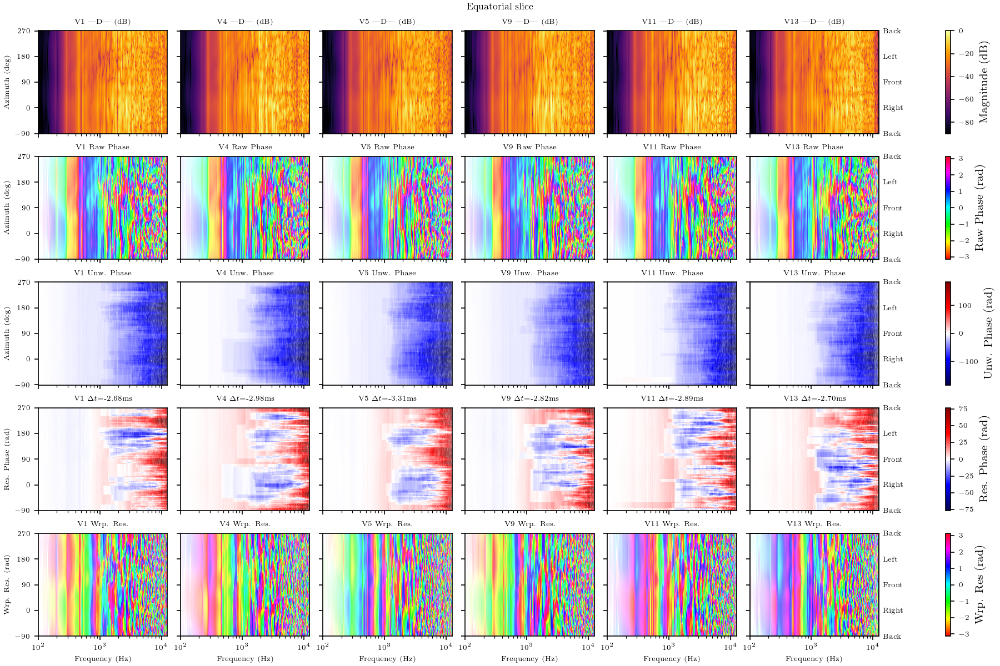

In [15]:

# Equatorial slice: Back(-90) -> Right(0) -> Front(90) -> Left(180) -> Back(270)

GlobMax = np.percentile(np.abs(FFD), 99.9)
print(f"Global max of |FFD| (99.9%): {GlobMax:.4e}")

Ph_plot = np.linspace(-np.pi/2, 3*np.pi/2, 361) # 1-degree resolution continuous axis
Ph_eval = Ph_plot
Th_eval = np.ones_like(Ph_plot)*np.pi/2


Dirs_Eq = np.column_stack((Th_eval, Ph_eval))
NbDirs = Dirs_Eq.shape[0]
print(f"Starting Equatorial slice directivity (Dinf) computation...")

EqFFD = np.zeros((NbViol, NbDirs, NbFreqs), dtype=np.complex128)
print(f"EqFFD shape: {EqFFD.shape}, dtype: {EqFFD.dtype}")
for i in tqdm(range(NbViol), desc="Violins"):    
    EqFFD[i] = swd.compute_Dinf_from_SH_coefs_at_origin(Cmn[i], Dirs_Eq, kvect)

print("Equatorial slice FFD computation complete!")
print(f"EqFFD magnitude range: [{np.abs(EqFFD).min():.3e}, {np.abs(EqFFD).max():.3e}]")
print(f"EqFFD real part range: [{EqFFD.real.min():.3e}, {EqFFD.real.max():.3e}]")
print(f"EqFFD imag part range: [{EqFFD.imag.min():.3e}, {EqFFD.imag.max():.3e}]")
EqFFDdB = 20*np.log10(np.abs(EqFFD)/GlobMax)
EqFFDdB[EqFFDdB > 0] = 0


# Plotting
fs = 6
fig, axes = plt.subplots(5, NbViol, figsize=(NbViol*2, 8), sharex=True, sharey=True, constrained_layout=True)
fig.suptitle('Equatorial slice', fontsize=fs+2)

pcm_mag_list = []
pcm_raw_list = []
pcm_unwrapped_list = []
pcm_resphase_list = []
pcm_wrapres_list = []

for v in range(NbViol):
    slice_MdB = EqFFDdB[v, :, :]
    slice_Ang = np.angle(EqFFD[v, :, :])

    # --- Magnitude Plot (Row 0) ---
    ax_mag = axes[0, v]
    pcm_mag = ax_mag.pcolormesh(frq, Ph_plot * 180 / np.pi, slice_MdB, cmap='inferno', vmin=-DyndB, vmax=0, shading='auto')
    pcm_mag_list.append(pcm_mag)
    ax_mag.set_title(f'V{NumViolon[v]} |D| (dB)', fontsize=fs)
    ax_mag.tick_params(labelsize=fs)
    ax_mag.set_xscale('log')
    ax_mag.set_xlim(100, frqMax)
    if v == 0:
        ax_mag.set_ylabel('Azimuth (deg)', fontsize=fs)

    alpha = np.clip((slice_MdB - (-DyndB)) / DyndB, 0, 1)

    # --- Raw Phase Plot (Row 1) ---
    ax_raw = axes[1, v]
    pcm_raw = ax_raw.pcolormesh(frq, Ph_plot * 180 / np.pi, slice_Ang, cmap='hsv', vmin=-np.pi, vmax=np.pi, shading='auto')
    pcm_raw_list.append(pcm_raw)
    norm_raw = plt.Normalize(-np.pi, np.pi)
    raw_colors = plt.get_cmap('hsv')(norm_raw(slice_Ang))
    raw_colors[..., 3] = alpha
    pcm_raw.set_array(None)
    pcm_raw.set_facecolors(raw_colors.reshape(-1, 4))
    ax_raw.set_title(f'V{NumViolon[v]} Raw Phase', fontsize=fs)
    ax_raw.tick_params(labelsize=fs)
    ax_raw.set_xscale('log')
    ax_raw.set_xlim(100, frqMax)
    if v == 0:
        ax_raw.set_ylabel('Azimuth (deg)', fontsize=fs)

    # --- Unwrapped Phase Plot (Row 2) ---
    UnwrappedPhase = np.unwrap(slice_Ang, axis=1)

    mean_up = np.mean(UnwrappedPhase, axis=0)
    fit_mask = (frq >= 500) & (frq <= 5000)
    slope, intercept = np.polyfit(frq[fit_mask], mean_up[fit_mask], 1)
    common_delay_ms = (slope / (2 * np.pi)) * 1000
    
    # Make unwrapped phase start at 0 for f=0
    UnwrappedPhase -= np.round(intercept / (2 * np.pi)) * 2 * np.pi
    
    ep_lim = np.percentile(np.abs(UnwrappedPhase), 98)
    ax_uw = axes[2, v]
    pcm_uw = ax_uw.pcolormesh(frq, Ph_plot * 180 / np.pi, UnwrappedPhase, cmap='seismic', vmin=-ep_lim, vmax=ep_lim, shading='auto')
    pcm_unwrapped_list.append(pcm_uw)
    norm_uw = plt.Normalize(-ep_lim, ep_lim)
    uw_colors = plt.get_cmap('seismic')(norm_uw(UnwrappedPhase))
    uw_colors[..., 3] = alpha
    pcm_uw.set_array(None)
    pcm_uw.set_facecolors(uw_colors.reshape(-1, 4))
    ax_uw.set_title(f'V{NumViolon[v]} Unw. Phase', fontsize=fs)
    ax_uw.tick_params(labelsize=fs)
    ax_uw.set_xscale('log')
    ax_uw.set_xlim(100, frqMax)
    if v == 0:
        ax_uw.set_ylabel('Azimuth (deg)', fontsize=fs)

    # --- Residual Phase Plot (Row 3) ---
    ResidualPhase = UnwrappedPhase - (slope * frq[np.newaxis, :] + intercept - np.round(intercept / (2 * np.pi)) * 2 * np.pi)
    
    res_lim = np.percentile(np.abs(ResidualPhase), 98)
    ax_res = axes[3, v]
    pcm_res = ax_res.pcolormesh(frq, Ph_plot * 180 / np.pi, ResidualPhase, cmap='seismic', vmin=-res_lim, vmax=res_lim, shading='auto')
    pcm_resphase_list.append(pcm_res)
    norm_res = plt.Normalize(-res_lim, res_lim)
    res_colors = plt.get_cmap('seismic')(norm_res(ResidualPhase))
    res_colors[..., 3] = alpha
    pcm_res.set_array(None)
    pcm_res.set_facecolors(res_colors.reshape(-1, 4))
    ax_res.set_title(f'V{NumViolon[v]} $\\Delta t$={common_delay_ms:.2f}ms', fontsize=fs)
    ax_res.tick_params(labelsize=fs)
    ax_res.set_xscale('log')
    ax_res.set_xlim(100, frqMax)
    if v == 0:
        ax_res.set_ylabel('Res. Phase (rad)', fontsize=fs)

    # --- Wrapped Residual Phase Plot (Row 4) ---
    ax_wrapres = axes[4, v]
    WrappedResidualPhase = np.angle(np.exp(1j * ResidualPhase))
    pcm_wrapres = ax_wrapres.pcolormesh(frq, Ph_plot * 180 / np.pi, WrappedResidualPhase, cmap='hsv', vmin=-np.pi, vmax=np.pi, shading='auto')
    pcm_wrapres_list.append(pcm_wrapres)
    norm_wrapres = plt.Normalize(-np.pi, np.pi)
    wrapres_colors = plt.get_cmap('hsv')(norm_wrapres(WrappedResidualPhase))
    wrapres_colors[..., 3] = alpha
    pcm_wrapres.set_array(None)
    pcm_wrapres.set_facecolors(wrapres_colors.reshape(-1, 4))
    ax_wrapres.set_title(f'V{NumViolon[v]} Wrp. Res.', fontsize=fs)
    ax_wrapres.set_xlabel('Frequency (Hz)', fontsize=fs)
    ax_wrapres.tick_params(labelsize=fs)
    ax_wrapres.set_xscale('log')
    ax_wrapres.set_xlim(100, frqMax)
    if v == 0:
        ax_wrapres.set_ylabel('Wrp. Res. (rad)', fontsize=fs)


# Direction labels on twin y-axis of last column
dir_ticks  = [-90, 0, 90, 180, 270]
dir_labels = ['Back', 'Right', 'Front', 'Left', 'Back']
ymin, ymax = -90, 270

for ax_row in axes[:, NbViol - 1]:
    ax2 = ax_row.twinx()
    ax2.set_ylim(ymin, ymax)
    ax2.set_yticks(dir_ticks)
    ax2.set_yticklabels(dir_labels, fontsize=fs)
    ax2.margins(y=0)
    ax2.tick_params(axis='y', length=0)
    ax_row.set_yticks(dir_ticks)

fig.colorbar(pcm_mag_list[0], ax=axes[0, :], location='right', label='Magnitude (dB)').ax.tick_params(labelsize=fs)
fig.colorbar(pcm_raw_list[0], ax=axes[1, :], location='right', label='Raw Phase (rad)').ax.tick_params(labelsize=fs)
fig.colorbar(pcm_unwrapped_list[0], ax=axes[2, :], location='right', label='Unw. Phase (rad)').ax.tick_params(labelsize=fs)
fig.colorbar(pcm_resphase_list[0], ax=axes[3, :], location='right', label='Res. Phase (rad)').ax.tick_params(labelsize=fs)
fig.colorbar(pcm_wrapres_list[0], ax=axes[4, :], location='right', label='Wrp. Res (rad)').ax.tick_params(labelsize=fs)

plt.show()

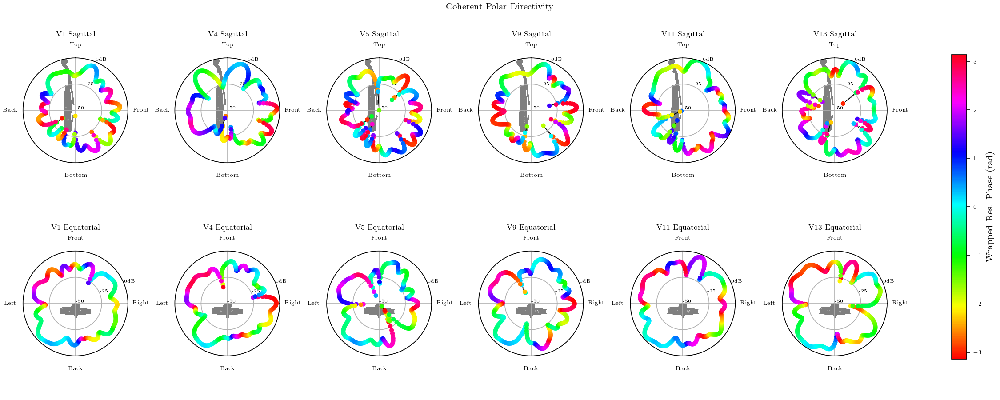

In [16]:

# Compute coherent sum according to frequency
SagCoh = np.sum(SagFFD, axis=2)
EqCoh = np.sum(EqFFD, axis=2)

GlobMaxCoh = max(np.max(np.abs(SagCoh)), np.max(np.abs(EqCoh)))
DynCoh = 50 # Dynamic range in dB for polar plot

fig, axes = plt.subplots(2, NbViol, figsize=(NbViol*2.5, 6), subplot_kw={'projection': 'polar'}, constrained_layout=True)
fig.suptitle('Coherent Polar Directivity', fontsize=fs+4)

# Calculate global scale for violin outline overlay
if 'vertices' in locals() and 'faces' in locals():
    # We want the violin to occupy the inner 25% of the radius (e.g. inner 12.5 dB)
    r_max_violin = np.max(np.linalg.norm(vertices, axis=1)) + 1e-12
    scale_violin = (DynCoh / 1) / r_max_violin

for v in range(NbViol):
    for row, (coh_data, angles, plane_name) in enumerate([(SagCoh[v], Th_plot, "Sagittal"), (EqCoh[v], Ph_plot, "Equatorial")]):
        ax = axes[row, v]
        
        mag_dB = 20 * np.log10(np.abs(coh_data) / GlobMaxCoh)
        mag_dB = np.clip(mag_dB, -DynCoh, 0)
        
        # Calculate Phase of the coherent sum, which corresponds to the broadband wrapped residual phase
        phase = np.angle(coh_data)
        
        # Plot as a scatter to avoid LineCollection discontinuities
        ax.plot(angles, mag_dB, color='k', linewidth=0.5, zorder=1) # optional thin line back
        sc = ax.scatter(angles, mag_dB, c=phase, cmap='hsv', norm=plt.Normalize(-np.pi, np.pi), s=15, zorder=2)
        
        ax.set_ylim(-DynCoh, 0)
        
        ax.set_yticks([-50, -25, 0])
        ax.set_yticklabels(['-50', '-25', '0dB'], fontsize=fs-1)
        
        # Ensure polar plot spans full 2pi radians
        ax.set_xlim(0, 2*np.pi)
        
        if row == 0:
            # Sagittal: 0 at Top (N), 90 Front (E)
            ax.set_theta_zero_location('N')
            ax.set_theta_direction(-1)
            ax.set_xticks([0, np.pi/2, np.pi, 3*np.pi/2])
            ax.set_xticklabels(['Top', 'Front', 'Bottom', 'Back'], fontsize=fs)
            ax.set_title(f'V{NumViolon[v]} {plane_name}', fontsize=fs+2)
            # Draw Violin Mesh Outline (XZ Plane)
            if 'vertices' in locals() and 'faces' in locals():
                r_xz = np.hypot(vertices[:,0], vertices[:,2])
                r_xz_scaled = (r_xz * scale_violin) - DynCoh
                # Angle from Z (Top) to -X (to turn front-to-back)
                th_xz = np.arctan2(-vertices[:,0], vertices[:,2])
                ax.triplot(th_xz, r_xz_scaled, triangles=faces, color='k', alpha=0.5, linewidth=0.3)
            
        else:
            # Equatorial: 0 at Right (E), 90 Front (N)
            ax.set_theta_zero_location('E')
            ax.set_theta_direction(1)
            ax.set_xticks([0, np.pi/2, np.pi, 3*np.pi/2])
            ax.set_xticklabels(['Right', 'Front', 'Left', 'Back'], fontsize=fs)
            ax.set_title(f'V{NumViolon[v]} {plane_name}', fontsize=fs+2)
            # Draw Violin Mesh Outline (XY Plane)
            if 'vertices' in locals() and 'faces' in locals():
                r_xy = np.hypot(vertices[:,0], vertices[:,1])
                r_xy_scaled = (r_xy * scale_violin) - DynCoh
                # Angle from -Y (Right) to -X (to turn front-to-back)
                th_xy = np.arctan2(-vertices[:,0], -vertices[:,1])
                ax.triplot(th_xy, r_xy_scaled, triangles=faces, color='k', alpha=0.5, linewidth=0.3)

cbar = fig.colorbar(sc, ax=axes, location='right', label='Wrapped Res. Phase (rad)', shrink=0.8)
cbar.ax.tick_params(labelsize=fs)

plt.show()